In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
!pip install pip-21.3.1-py3-none-any.whl -f ./ --no-index
!pip install loguru-0.5.3-py3-none-any.whl -f ./ --no-index
!pip install ninja-1.10.2.3-py2.py3-none-manylinux_2_5_x86_64.manylinux1_x86_64.whl -f ./ --no-index
!pip install onnx-1.8.1-cp37-cp37m-manylinux2010_x86_64.whl -f ./ --no-index
!pip install onnxruntime-1.8.0-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl -f ./ --no-index
!pip install onnxoptimizer-0.2.6-cp37-cp37m-manylinux2014_x86_64.whl -f ./ --no-index
!pip install thop-0.0.31.post2005241907-py3-none-any.whl -f ./ --no-index
!pip install tabulate-0.8.9-py3-none-any.whl -f ./ --no-index

Looking in links: ./
Processing ./pip-21.3.1-py3-none-any.whl
ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: '/kaggle/working/pip-21.3.1-py3-none-any.whl'

Looking in links: ./
Processing ./loguru-0.5.3-py3-none-any.whl
ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: '/kaggle/working/loguru-0.5.3-py3-none-any.whl'

Looking in links: ./
Processing ./ninja-1.10.2.3-py2.py3-none-manylinux_2_5_x86_64.manylinux1_x86_64.whl
ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: '/kaggle/working/ninja-1.10.2.3-py2.py3-none-manylinux_2_5_x86_64.manylinux1_x86_64.whl'

Looking in links: ./
Processing ./onnx-1.8.1-cp37-cp37m-manylinux2010_x86_64.whl
ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: '/kaggle/working/onnx-1.8.1-cp37-cp37m-manylinux2010_x86_64.whl'

Looking in links: ./
Processing ./onnxruntime-1.8.0-cp37-cp37m-manylinux_2_1

In [3]:
# norfair dependencies
%cd /kaggle/input/norfair031py3/
!pip install commonmark-0.9.1-py2.py3-none-any.whl -f ./ --no-index
!pip install rich-9.13.0-py3-none-any.whl

!mkdir /kaggle/working/tmp
!cp -r /kaggle/input/norfair031py3/filterpy-1.4.5/filterpy-1.4.5/ /kaggle/working/tmp/
%cd /kaggle/working/tmp/filterpy-1.4.5/
!pip install .
!rm -rf /kaggle/working/tmp

# norfair
%cd /kaggle/input/norfair031py3/
!pip install norfair-0.3.1-py3-none-any.whl -f ./ --no-index

/kaggle/input/norfair031py3
Looking in links: ./
Processing ./commonmark-0.9.1-py2.py3-none-any.whl
Processing ./rich-9.13.0-py3-none-any.whl
/kaggle/working/tmp/filterpy-1.4.5
Processing /kaggle/working/tmp/filterpy-1.4.5
  Preparing metadata (setup.py) ... - done
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110474 sha256=cf4f27fe663c6e338038c3cd27527bb0df32b0ffc7e0891f4d4846bdfbfda5be
  Stored in directory: /root/.cache/pip/wheels/0e/ba/6d/20557ee403bc0c849d9fe3b358ded9918d7d2b0c5b0253fc99
Successfully built filterpy
/kaggle/input/norfair031py3
Looking in links: ./
Processing ./norfair-0.3.1-py3-none-any.whl


# 📚 Import Libraries

In [4]:
import numpy as np
from tqdm.notebook import tqdm
tqdm.pandas()
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import glob
import shutil
import sys
sys.path.append('../input/tensorflow-great-barrier-reef')
import torch
from PIL import Image
import ast
import albumentations as albu
# import pycocotools
import warnings
warnings.filterwarnings("ignore")
import importlib
from PIL import Image
from IPython.display import display


In [5]:
import sys 
sys.path.append('/kaggle/input/ensemble-boxes-104/ensemble_boxes-1.0.4')
from ensemble_boxes import *

In [6]:
ROOT_DIR  = '/kaggle/input/tensorflow-great-barrier-reef/'
list_yolov5_checkpoint = [
    '/kaggle/input/yolov5s6/yolov5s6_10.pt',
    '/kaggle/input/reef-baseline-fold12/l6_3600_uflip_vm5_f12_up/f1/best.pt'
]
# '/kaggle/input/yolov5s6/yolov5s6_sub9.pt'

IMG_SIZE = 6200

test_size_yolov5  = [6200,3600]#int(1664*1.75)
list_yolov5_conf  = [0.30,0.28]
yolov5_iou       = [0.5,0.4]

AUGMENT   = True
FDA_aug = False

# ensemble WBF seting
weighted_ensemble = [4,2]
iou_ensemble = 0.5
skip_box_thr = 0.0001
sigma = 0.1

In [7]:
def get_path(row):
    row['image_path'] = f'{ROOT_DIR}/train_images/video_{row.video_id}/{row.video_frame}.jpg'
    return row

In [8]:
# Train Data
df = pd.read_csv(f'{ROOT_DIR}/train.csv')
df = df.progress_apply(get_path, axis=1)
df['annotations'] = df['annotations'].progress_apply(lambda x: ast.literal_eval(x))
display(df.head(2))

  0%|          | 0/23501 [00:00<?, ?it/s]

  0%|          | 0/23501 [00:00<?, ?it/s]

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,image_path
0,0,40258,0,0,0-0,[],/kaggle/input/tensorflow-great-barrier-reef//t...
1,0,40258,1,1,0-1,[],/kaggle/input/tensorflow-great-barrier-reef//t...


In [9]:
FDA_reference = df[df['annotations']!='[]']

In [10]:
FDA_trans = albu.FDA(FDA_reference['image_path'].values)

## Number of BBoxes

In [11]:
df['num_bbox'] = df['annotations'].progress_apply(lambda x: len(x))
data = (df.num_bbox>0).value_counts()/len(df)*100
print(f"No BBox: {data[0]:0.2f}% | With BBox: {data[1]:0.2f}%")

  0%|          | 0/23501 [00:00<?, ?it/s]

No BBox: 79.07% | With BBox: 20.93%


# 🔨 Helper

In [12]:
def voc2yolo(bboxes, image_height=720, image_width=1280):
    """
    voc  => [x1, y1, x2, y1]
    yolo => [xmid, ymid, w, h] (normalized)
    """
    
    bboxes = bboxes.copy().astype(float) # otherwise all value will be 0 as voc_pascal dtype is np.int
    
    bboxes[..., [0, 2]] = bboxes[..., [0, 2]]/ image_width
    bboxes[..., [1, 3]] = bboxes[..., [1, 3]]/ image_height
    
    w = bboxes[..., 2] - bboxes[..., 0]
    h = bboxes[..., 3] - bboxes[..., 1]
    
    bboxes[..., 0] = bboxes[..., 0] + w/2
    bboxes[..., 1] = bboxes[..., 1] + h/2
    bboxes[..., 2] = w
    bboxes[..., 3] = h
    
    return bboxes

def yolo2voc(bboxes, image_height=720, image_width=1280):
    """
    yolo => [xmid, ymid, w, h] (normalized)
    voc  => [x1, y1, x2, y1]
    
    """ 
    bboxes = bboxes.copy().astype(float) # otherwise all value will be 0 as voc_pascal dtype is np.int
    
    bboxes[..., [0, 2]] = bboxes[..., [0, 2]]* image_width
    bboxes[..., [1, 3]] = bboxes[..., [1, 3]]* image_height
    
    bboxes[..., [0, 1]] = bboxes[..., [0, 1]] - bboxes[..., [2, 3]]/2
    bboxes[..., [2, 3]] = bboxes[..., [0, 1]] + bboxes[..., [2, 3]]
    
    return bboxes

def coco2yolo(bboxes, image_height=720, image_width=1280):
    """
    coco => [xmin, ymin, w, h]
    yolo => [xmid, ymid, w, h] (normalized)
    """
    
    bboxes = bboxes.copy().astype(float) # otherwise all value will be 0 as voc_pascal dtype is np.int
    
    # normolizinig
    bboxes[..., [0, 2]]= bboxes[..., [0, 2]]/ image_width
    bboxes[..., [1, 3]]= bboxes[..., [1, 3]]/ image_height
    
    # converstion (xmin, ymin) => (xmid, ymid)
    bboxes[..., [0, 1]] = bboxes[..., [0, 1]] + bboxes[..., [2, 3]]/2
    
    return bboxes

def yolo2coco(bboxes, image_height=720, image_width=1280):
    """
    yolo => [xmid, ymid, w, h] (normalized)
    coco => [xmin, ymin, w, h]
    
    """ 
    bboxes = bboxes.copy().astype(float) # otherwise all value will be 0 as voc_pascal dtype is np.int
    
    # denormalizing
    bboxes[..., [0, 2]]= bboxes[..., [0, 2]]* image_width
    bboxes[..., [1, 3]]= bboxes[..., [1, 3]]* image_height
    
    # converstion (xmid, ymid) => (xmin, ymin) 
    bboxes[..., [0, 1]] = bboxes[..., [0, 1]] - bboxes[..., [2, 3]]/2
    
    return bboxes

def voc2coco(bboxes, image_height=720, image_width=1280):
    bboxes  = voc2yolo(bboxes, image_height, image_width)
    bboxes  = yolo2coco(bboxes, image_height, image_width)
    return bboxes


def load_image(image_path):
    return cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)


def plot_one_box(x, img, color=None, label=None, line_thickness=None):
    # Plots one bounding box on image img
    tl = line_thickness or round(0.002 * (img.shape[0] + img.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(img, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(img, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(img, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)

def draw_bboxes(img, bboxes, classes, class_ids, colors = None, show_classes = None, bbox_format = 'yolo', class_name = False, line_thickness = 2):  
     
    image = img.copy()
    show_classes = classes if show_classes is None else show_classes
    colors = (0, 255 ,0) if colors is None else colors
    
    if bbox_format == 'yolo':
        
        for idx in range(len(bboxes)):  
            
            bbox  = bboxes[idx]
            cls   = classes[idx]
            cls_id = class_ids[idx]
            color = colors[cls_id] if type(colors) is list else colors
            
            if cls in show_classes:
            
                x1 = round(float(bbox[0])*image.shape[1])
                y1 = round(float(bbox[1])*image.shape[0])
                w  = round(float(bbox[2])*image.shape[1]/2) #w/2 
                h  = round(float(bbox[3])*image.shape[0]/2)

                voc_bbox = (x1-w, y1-h, x1+w, y1+h)
                plot_one_box(voc_bbox, 
                             image,
                             color = color,
                             label = cls if class_name else str(get_label(cls)),
                             line_thickness = line_thickness)
            
    elif bbox_format == 'coco':
        
        for idx in range(len(bboxes)):  
            
            bbox  = bboxes[idx]
            cls   = classes[idx]
            cls_id = class_ids[idx]
            color = colors[cls_id] if type(colors) is list else colors
            
            if cls in show_classes:            
                x1 = int(round(bbox[0]))
                y1 = int(round(bbox[1]))
                w  = int(round(bbox[2]))
                h  = int(round(bbox[3]))

                voc_bbox = (x1, y1, x1+w, y1+h)
                plot_one_box(voc_bbox, 
                             image,
                             color = color,
                             label = cls if class_name else str(cls_id),
                             line_thickness = line_thickness)

    elif bbox_format == 'voc_pascal':
        
        for idx in range(len(bboxes)):  
            
            bbox  = bboxes[idx]
            cls   = classes[idx]
            cls_id = class_ids[idx]
            color = colors[cls_id] if type(colors) is list else colors
            
            if cls in show_classes: 
                x1 = int(round(bbox[0]))
                y1 = int(round(bbox[1]))
                x2 = int(round(bbox[2]))
                y2 = int(round(bbox[3]))
                voc_bbox = (x1, y1, x2, y2)
                plot_one_box(voc_bbox, 
                             image,
                             color = color,
                             label = cls if class_name else str(cls_id),
                             line_thickness = line_thickness)
    else:
        raise ValueError('wrong bbox format')

    return image

def get_bbox(annots):
    bboxes = [list(annot.values()) for annot in annots]
    return bboxes

def get_imgsize(row):
    row['width'], row['height'] = imagesize.get(row['image_path'])
    return row

np.random.seed(32)
colors = [(np.random.randint(255), np.random.randint(255), np.random.randint(255))\
          for idx in range(1)]

In [13]:
##############################################################
#                      Tracking helpers                      #
##############################################################

import numpy as np
from norfair import Detection, Tracker

# Helper to convert bbox in format [x_min, y_min, x_max, y_max, score] to norfair.Detection class
def to_norfair(detects, frame_id):
    result = []
    for x_min, y_min, x_max, y_max, score in detects:
        xc, yc = (x_min + x_max) / 2, (y_min + y_max) / 2
        w, h = x_max - x_min, y_max - y_min
        result.append(Detection(points=np.array([xc, yc]), scores=np.array([score]), data=np.array([w, h, frame_id])))
        
    return result

# Euclidean distance function to match detections on this frame with tracked_objects from previous frames
def euclidean_distance(detection, tracked_object):
    return np.linalg.norm(detection.points - tracked_object.estimate)



In [14]:
# install yolov5 #
!mkdir -p /root/.config/Ultralytics
!cp /kaggle/input/yolov5-font/Arial.ttf /root/.config/Ultralytics/

In [15]:
def load_model(ckpt_path, conf=0.25, iou=0.50):
    model = torch.hub.load('/kaggle/input/yolov5-lib-ds',
                           'custom',
                           path=ckpt_path,
                           source='local',
                           force_reload=True)  # local repo
    model.conf = conf  # NMS confidence threshold
    model.iou  = iou  # NMS IoU threshold
    model.classes = None   # (optional list) filter by class, i.e. = [0, 15, 16] for persons, cats and dogs
    model.multi_label = False  # NMS multiple labels per box
    model.max_det = 1000  # maximum number of detections per image
    return model

# 🔭 Inference

## Helper

In [16]:
def predict_yolov5(model, img, size=768, augment=False):
    height, width = img.shape[:2]
    results = model(img, size=size, augment=augment)  # custom inference size
    preds   = results.pandas().xyxy[0]
    bboxes  = preds[['xmin','ymin','xmax','ymax']].values
    if len(bboxes):
        bboxes  = voc2coco(bboxes,height,width).astype(int)
        confs   = preds.confidence.values
        return bboxes, confs
    else:
        return [],[]
    
def format_prediction(bboxes, confs):
    annot = ''
    if len(bboxes)>0:
        for idx in range(len(bboxes)):
            xmin, ymin, w, h = bboxes[idx]
            conf             = confs[idx]
            annot += f'{conf} {xmin} {ymin} {w} {h}'
            annot +=' '
        annot = annot.strip(' ')
    return annot

def show_img(img, bboxes, bbox_format='yolo'):
    names  = ['starfish']*len(bboxes)
    labels = [0]*len(bboxes)
    img    = draw_bboxes(img = img,
                           bboxes = bboxes, 
                           classes = names,
                           class_ids = labels,
                           class_name = True, 
                           colors = colors, 
                           bbox_format = bbox_format,
                           line_thickness = 2)
    return Image.fromarray(img).resize((800, 400))

In [17]:
def tracking_function(tracker, frame_id, bboxes, scores):
    
    detects = []
    predictions = []
    
    if len(scores)>0:
        for i in range(len(bboxes)):
            box = bboxes[i]
            score = scores[i]
            x_min = int(box[0])
            y_min = int(box[1])
            bbox_width = int(box[2])
            bbox_height = int(box[3])
            detects.append([x_min, y_min, x_min+bbox_width, y_min+bbox_height, score])
            predictions.append('{:.2f} {} {} {} {}'.format(score, x_min, y_min, bbox_width, bbox_height))
#             print(predictions[:-1])
    # Update tracks using detects from current frame
    tracked_objects = tracker.update(detections=to_norfair(detects, frame_id))
    for tobj in tracked_objects:
        bbox_width, bbox_height, last_detected_frame_id = tobj.last_detection.data
        if last_detected_frame_id == frame_id:  # Skip objects that were detected on current frame
            continue
        # Add objects that have no detections on current frame to predictions
        xc, yc = tobj.estimate[0]
        x_min, y_min = int(round(xc - bbox_width / 2)), int(round(yc - bbox_height / 2))
        score = tobj.last_detection.scores[0]

        predictions.append('{:.2f} {} {} {} {}'.format(score, x_min, y_min, bbox_width, bbox_height))
        
    return predictions

## Run Inference on **Train**

In [18]:
def normalize_and_clip(bboxes, test_size = (int(1280*1.3*1.75),int(720*1.3*1.75))):
    bboxes = bboxes.astype(float)
    bboxes[...,[0,2]] = bboxes[...,[0,2]]/test_size[0]
    bboxes[...,[1,3]] = bboxes[...,[1,3]]/test_size[1]
    bboxes = np.clip(bboxes,0,1)
    return bboxes

def denormalize_and_transform_to_tracking_form(bboxes,test_size=(1280*1.3*1.75,720*1.3*1.75)):
    
    bboxes[...,[0,2]] = bboxes[...,[0,2]]*test_size[0]
    bboxes[...,[1,3]] = bboxes[...,[1,3]]*test_size[1]
    
    bboxes[...,[2,3]] = bboxes[...,[2,3]] - bboxes[...,[0,1]] 
    
    return bboxes

In [19]:
def run_wbf(bboxes, confs,classs, image_size, iou_thr=0.50, skip_box_thr=0.0001, weights=None):
#     print(bboxes[0])
    boxes =  [bbox/(image_size-1) for bbox in bboxes]
    scores = [conf for conf in confs]    
    labels = [np.ones(conf.shape[0]) for conf in confs]
    boxes, scores, labels = weighted_boxes_fusion(boxes, scores, labels, weights=None, iou_thr=iou_thr, skip_box_thr=skip_box_thr)
    boxes = boxes*(image_size-1)
    return boxes, scores, labels

In [20]:
def predict_all_stage(tracker, img):
    IMG_SIZE = 6200
    bboxes_yolov5_fold0, scores_yolov5_fold0 = predict_yolov5(model_yolov5_fold0, img, size=test_size_yolov5[0], augment=AUGMENT)
    if len(bboxes_yolov5_fold0)>0:
        
        bboxes_yolov5_fold0[...,[2,3]] = bboxes_yolov5_fold0[...,[0,1]] + bboxes_yolov5_fold0[...,[2,3]]
#         print('bboxes_yolov5_fold0 before normalize', bboxes_yolov5_fold0)
        bboxes_yolov5_fold0 = normalize_and_clip(bboxes_yolov5_fold0)
#         print('bboxes_yolov5_fold0 after normalize', bboxes_yolov5_fold0)
    bboxes_yolov5_fold1, scores_yolov5_fold1 = predict_yolov5(model_yolov5_fold1, img, size=test_size_yolov5[1], augment=AUGMENT)
    if len(bboxes_yolov5_fold1)>0:
#         print('bboxes_yolov5_fold1')
        bboxes_yolov5_fold1[...,[2,3]] = bboxes_yolov5_fold1[...,[0,1]] + bboxes_yolov5_fold1[...,[2,3]]
        bboxes_yolov5_fold1 = normalize_and_clip(bboxes_yolov5_fold1)
    
#     bboxes_yolov5_fold2, scores_yolov5_fold2 = predict_yolov5(model_yolov5_fold2, img, size=test_size_yolov5[2], augment=AUGMENT)
#     if len(bboxes_yolov5_fold2)>0:
# #         print('bboxes_yolov5_fold2')
#         bboxes_yolov5_fold2[...,[2,3]] = bboxes_yolov5_fold2[...,[0,1]] + bboxes_yolov5_fold2[...,[2,3]]
#         bboxes_yolov5_fold2 = normalize_and_clip(bboxes_yolov5_fold2)
    
#     bboxes = [bboxes_yolov5_fold0, bboxes_yolov5_fold1, bboxes_yolov5_fold2]
#     scores = [scores_yolov5_fold0, scores_yolov5_fold1, scores_yolov5_fold2]
    bboxes = [bboxes_yolov5_fold0, bboxes_yolov5_fold1]
    scores = [scores_yolov5_fold0, scores_yolov5_fold1]
#     print('last bboxes_yolov5_fold0',bboxes_yolov5_fold0)
#     label = [[0]*len(bboxes_yolov5_fold0), [0]*len(bboxes_yolov5_fold1), [0]*len(bboxes_yolov5_fold2)]
    label = [[0]*len(bboxes_yolov5_fold0), [0]*len(bboxes_yolov5_fold1)]
#     print(bboxes)
#     print(np.array(bboxes).shape)
    # xmin, ymin, xmax, ymax  -> normlize
    bboxes, scores, labels = weighted_boxes_fusion(bboxes, scores, label, weights=weighted_ensemble, iou_thr=iou_ensemble, skip_box_thr=skip_box_thr)
#     bboxes, scores, labels  = run_wbf(bboxes, scores,label,IMG_SIZE, iou_ensemble, skip_box_thr,weights=weighted_ensemble)
#     print(bboxes)
    # bboxes -> xmin , ymin, width, height #
    bboxes = denormalize_and_transform_to_tracking_form(bboxes)
    
    predict_box = tracking_function(tracker, frame_id, bboxes, scores)
    return predict_box

In [21]:
!mkdir -p /root/.config/Ultralytics
!cp /kaggle/input/yolov5-font/Arial.ttf /root/.config/Ultralytics/

In [22]:
cd /kaggle/woking

[Errno 2] No such file or directory: '/kaggle/woking'
/kaggle/input/norfair031py3


YOLOv5 🚀 2022-2-5 torch 1.9.1 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 280 layers, 12308200 parameters, 0 gradients
Adding AutoShape... 
YOLOv5 🚀 2022-2-5 torch 1.9.1 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 280 layers, 12308200 parameters, 0 gradients
Adding AutoShape... 


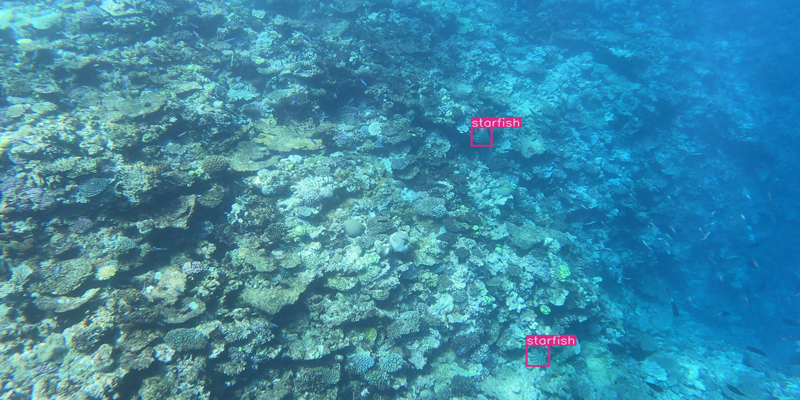

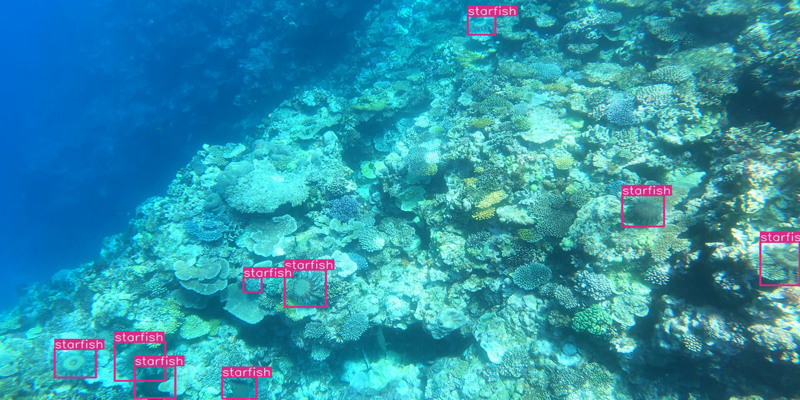

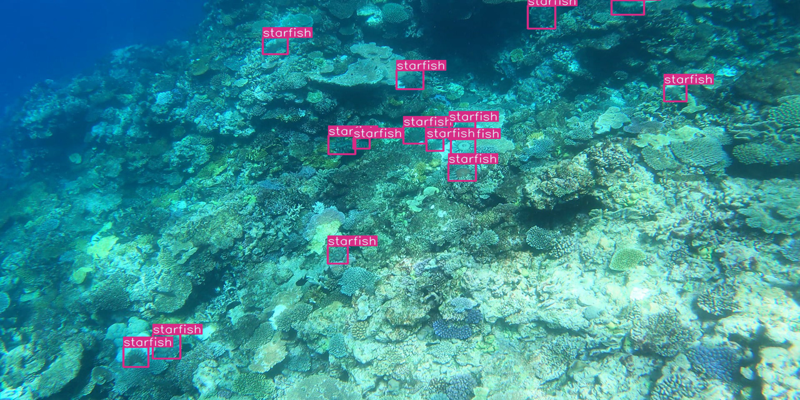

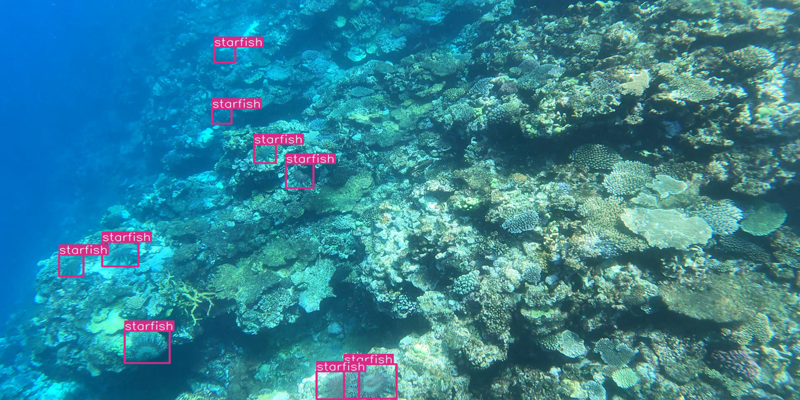

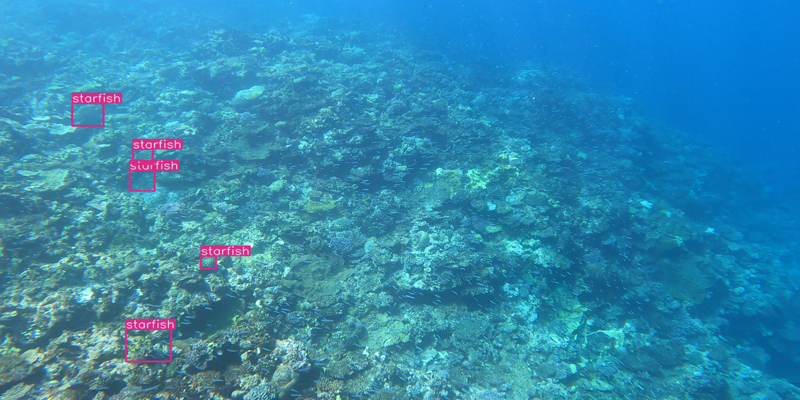

...

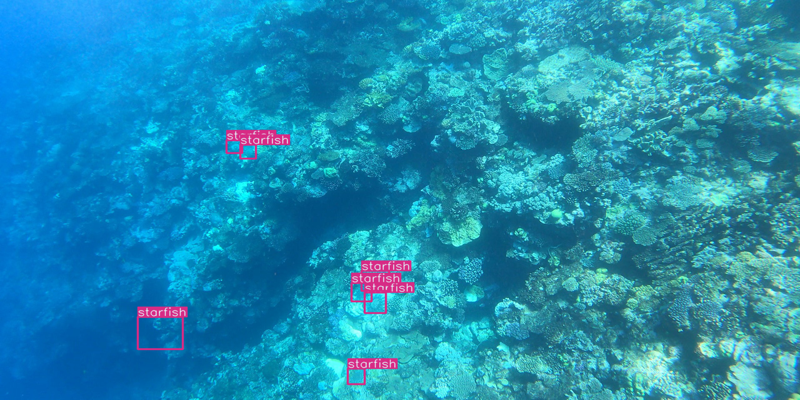

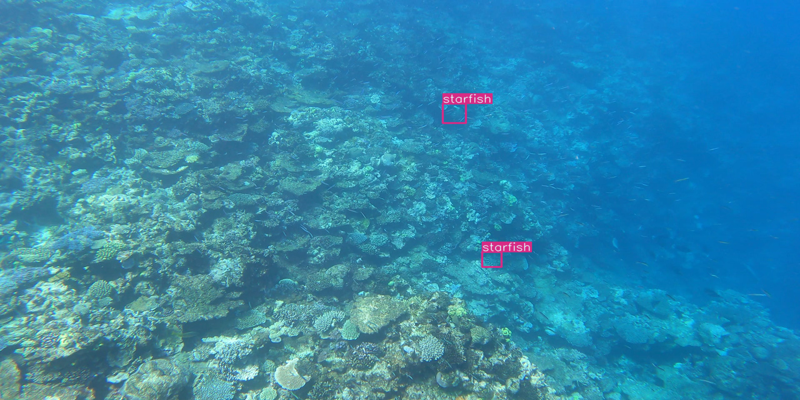

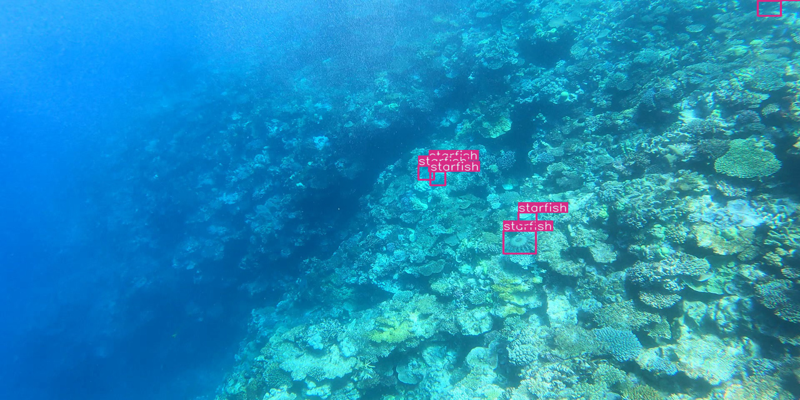

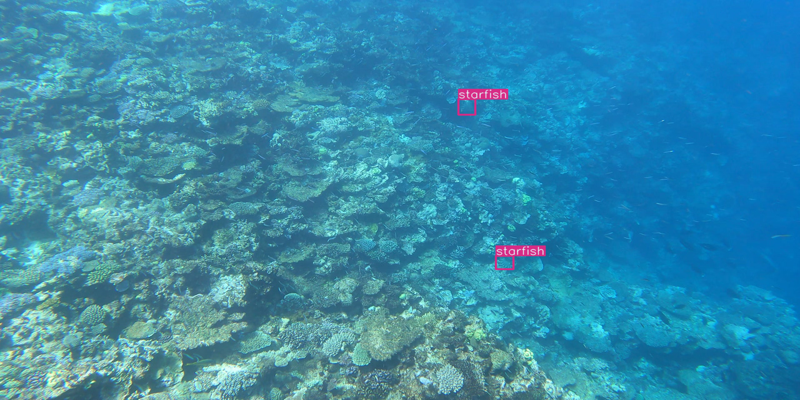

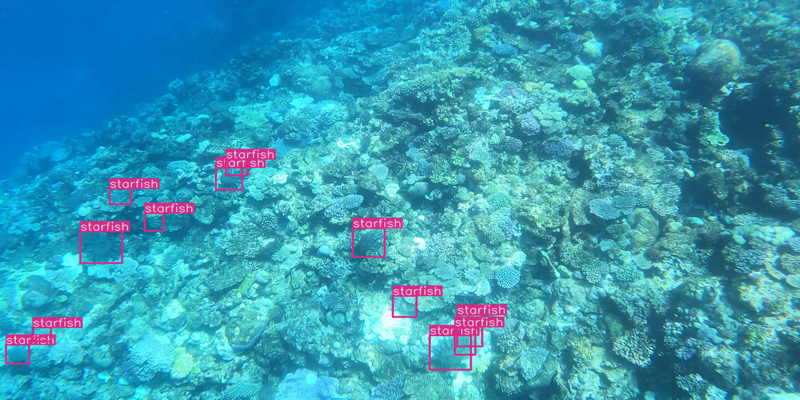

In [23]:
tracker = Tracker(
    distance_function=euclidean_distance, 
    distance_threshold=30,
    hit_inertia_min=3,
    hit_inertia_max=6,
    initialization_delay=1,
)

model_yolov5_fold0 = load_model(list_yolov5_checkpoint[0], conf=list_yolov5_conf[0], iou=yolov5_iou[0])
model_yolov5_fold1 = load_model(list_yolov5_checkpoint[1], conf=list_yolov5_conf[1], iou=yolov5_iou[1])
# model_yolov5_fold2 = load_model(list_yolov5_checkpoint[2], conf=list_yolov5_conf[2], iou=yolov5_iou[2])

image_paths = df[df.num_bbox>1].sample(100).image_path.tolist()
frame_id = 0
for idx, path in enumerate(image_paths):
    img = cv2.imread(path)[...,::-1]
    if FDA_aug:
        img = FDA_trans(image=img)['image']
        
    predict_box = predict_all_stage(tracker, img)

    if len(predict_box)>0:
        box = [list(map(int,box.split(' ')[1:])) for box in predict_box]
    else:
        box = []
    display(show_img(img, box, bbox_format='coco'))
    if idx>10:
        break
    frame_id += 1

## Init `Env`

In [24]:
import greatbarrierreef
env = greatbarrierreef.make_env()# initialize the environment
iter_test = env.iter_test()      # an iterator which loops over the test set and sample submission

## Run Inference on **Test**

In [25]:
cd /kaggle/working

/kaggle/working


YOLOv5 🚀 2022-2-5 torch 1.9.1 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 280 layers, 12308200 parameters, 0 gradients
Adding AutoShape... 
YOLOv5 🚀 2022-2-5 torch 1.9.1 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 280 layers, 12308200 parameters, 0 gradients
Adding AutoShape... 


0it [00:00, ?it/s]

This version of the API is not optimized and should not be used to estimate the runtime of your code on the hidden test set.


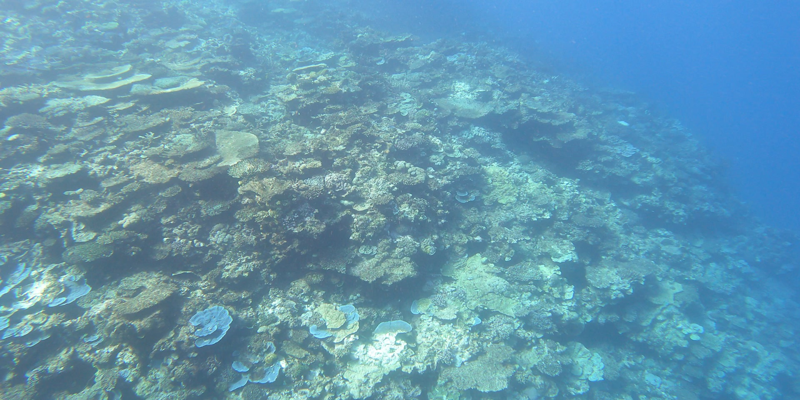

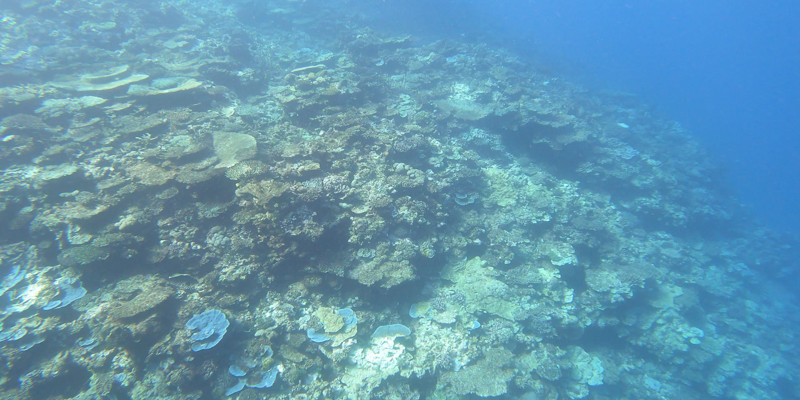

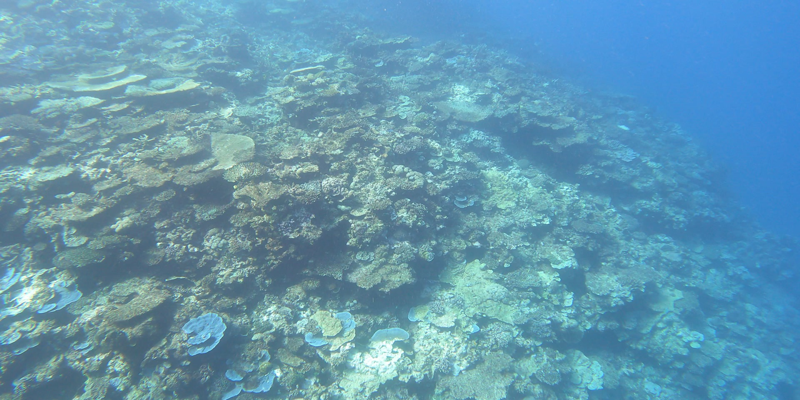

In [26]:
tracker = Tracker(
    distance_function=euclidean_distance, 
    distance_threshold=30,
    hit_inertia_min=3,
    hit_inertia_max=6,
    initialization_delay=1,
)
IMG_SIZE = 6200
# model = load_model(CKPT_PATH, conf=CONF, iou=IOU)
model_yolov5_fold0 = load_model(list_yolov5_checkpoint[0], conf=list_yolov5_conf[0], iou=yolov5_iou[0])
model_yolov5_fold1 = load_model(list_yolov5_checkpoint[1], conf=list_yolov5_conf[1], iou=yolov5_iou[1])
# model_yolov5_fold2 = load_model(list_yolov5_checkpoint[2], conf=list_yolov5_conf[2], iou=yolov5_iou[2])

frame_id =0
for idx, (img, pred_df) in enumerate(tqdm(iter_test)):
    if FDA_aug:
        img = FDA_trans(image=img)['image']
    predictions = predict_all_stage(tracker, img)
    prediction_str = ' '.join(predictions)
    pred_df['annotations'] = prediction_str
    env.predict(pred_df)
    if frame_id < 3:
        if len(predict_box)>0:
            box = [list(map(int,box.split(' ')[1:])) for box in predictions]
        else:
            box = []
        display(show_img(img, box, bbox_format='coco'))
#     print('Prediction:', pred_df)
    frame_id += 1

In [27]:
sub_df = pd.read_csv('submission.csv')
sub_df.head()

,index,annotations
0,0,NaN
1,1,NaN
2,2,NaN
